<a href="https://colab.research.google.com/github/BlackUBird/sLab/blob/main/sotuken001.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**2022/12/07 追記**
背景差分に必要な精度を調べるために、2つの画像の差分(変更のあった画素の数)を調べる  
openCV使用  
#**2022/12/14 追記**  
一回微分した画像を取得する関数2種とそれの結果を表示するコードを実装しました。

In [37]:
import cv2
import numpy as np
import matplotlib.pyplot as plt



In [12]:
# 読み込む画像の名前
"""
ImageNames = [
    "osc2022_8_10_2.png" ,
    "osc2022_8_10_3.png" ,
    "osc2022_8_10_5.png" ,
    "osc2022_8_10_6.png" ,
    "osc2022_8_24_0.png" ,
    "osc2022_8_24_36.png" ,
    "osc2022_8_24_37.png" ,
    "osc2022_8_24_40.png" ,
    "osc2022_8_31_0.png" ,
    "osc2022_9_7_0.png" ,
    "osc2022_9_12_17.png" ,
    "osc2022_9_12_18.png" ,
    "osc2022_9_21_0.png" ,
    "osc2022_9_21_5.png" ,
    "osc2022_10_5_16.png" ,
    "osc2022_10_5_58.png" ,
]
"""
ImageNames = [
    [ "osc2022_8_10_2.png" , "osc2022_8_10_3.png" , "osc2022_8_10_5.png" , "osc2022_8_10_6.png" ],
    [ "osc2022_8_24_0.png" , "osc2022_8_24_36.png" , "osc2022_8_24_37.png" , "osc2022_8_24_40.png" ],
    [ "osc2022_8_31_0.png" ],
    [ "osc2022_9_7_0.png" ],
    [ "osc2022_9_12_17.png" , "osc2022_9_12_18.png" ],
    [ "osc2022_9_21_0.png" , "osc2022_9_21_5.png" ],
    [ "osc2022_10_5_16.png" , "osc2022_10_5_58.png" ],
]
ImageNamesLen = len( ImageNames )

for i in range( 0 , ImageNamesLen , 1 ):
  print( i , ":" ,  ImageNames[ i ] )


0 : ['osc2022_8_10_2.png', 'osc2022_8_10_3.png', 'osc2022_8_10_5.png', 'osc2022_8_10_6.png']
1 : ['osc2022_8_24_0.png', 'osc2022_8_24_36.png', 'osc2022_8_24_37.png', 'osc2022_8_24_40.png']
2 : ['osc2022_8_31_0.png']
3 : ['osc2022_9_7_0.png']
4 : ['osc2022_9_12_17.png', 'osc2022_9_12_18.png']
5 : ['osc2022_9_21_0.png', 'osc2022_9_21_5.png']
6 : ['osc2022_10_5_16.png', 'osc2022_10_5_58.png']


#**各画素の差分値を返す関数**  
**宣言**  
GetImageDiff(im1,im2)  
**引数について**  
im1,im2 ：差分を求める画像  
**返却値について**  
im_diff ：求めた差分を格納した２次元配列

In [13]:
#@title
def GetImageDiff( im1 , im2 ):
  # 判別
  print( "im1 == im2 ? :" , np.array_equal( im1 , im2 ) )

  # 画像が同じ形でなければエラーとして終了
  if im1.shape != im2.shape :
    return None

  # 差分の値
  # 符号あり整数で計算(astype(int))
#  print( "Now:Get[Difference]" )
  im_diff = im1.astype(int) - im2.astype(int)
  # 差分の値の最大値・最小値を表示
#  print( "Difference(max):" , im_diff.max() )
#  print( "Difference(min):" , im_diff.min() )

  # 差分の値(符号あり)を返却
#  print( "return [Difference]" )
  return im_diff




#**差分値が0でない画素の数を返却する関数**  
**宣言**  
GetImageDiff_PixelNum( im_diff )  
**引数**  
im_diff ：事前に取得しておいた差分値  
**返却値**  
im_diff_pixel_num ：差分値が0でない画素の総数

In [14]:
def GetImageDiff_PixelNum( im_diff ):
  # 総数を格納
  im_diff_pixel_num = 0
  # 画像を格納した配列の形
  height,width = im_diff.shape
  print( height,width)

  # 数え上げ
  for i in range( width ):
    for j in range( height ):
      if im_diff[j , i] != 0:
        im_diff_pixel_num += 1

  # 返却
  return im_diff_pixel_num

#**画像を横方向に一回微分する関数**  
**宣言**  
GetImage_Filter_Sobel_X(image)  
**引数**  
image：横方向に一回微分される画像  
**返却値**  
image_sobel_x：横方向に一回微分された画像

In [57]:
def GetImage_Filter_Sobel_X( image ):
  # グレースケールにする
  image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

  # Sobelフィルターを適用する
  image_sobel_x = cv2.Sobel( image_gray , cv2.CV_32F , 1 , 0 , ksize=3 )

  # 返却
  return image_sobel_x

#**画像を縦方向に一回微分する関数**  
**宣言**  
GetImage_Filter_Sobel_Y(image)  
**引数**  
image：縦方向に一回微分される画像  
**返却値**  
image_sobel_y：縦方向に一回微分された画像

In [55]:
def GetImage_Filter_Sobel_Y( image ):
  # グレースケールにする
  image_gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

  # Sobelフィルターを適用する
  image_sobel_y = cv2.Sobel( image_gray , cv2.CV_32F , 0 , 1 , ksize=3 )

  # 返却
  return image_sobel_y

#**Laplacianフィルターを適用した画像を返却する関数**  
**宣言**  
GetImage_Filter_Laplacian(image)  
**引数**  
image：フィルタを適用される画像  
**返却値**  
image_laplacian：Laplacianフィルタを適用した後の画像

In [66]:
def GetImage_Filter_Laplacian( image ):
  # グレースケールにする
  image_gray = cv2.cvtColor(image , cv2.COLOR_RGB2GRAY )

  # Laplacianフィルターを適用する
  image_laplacian = cv2.Laplacian( image_gray , cv2.CV_32F)

  # 返却
  return image_laplacian

#**キャニー法を適用した画像を返却する関数**  
###最大閾値:200 最少閾値:100  
**宣言**  
GetImage_Filter_Canny(image)  
**引数**  
image：キャニー法を適用される画像  
**返却値**  
image_canny：キャニー法を適用した後の画像

In [89]:
def GetImage_Filter_Canny( image ):
  # グレースケールにする
  image_gray = cv2.cvtColor(image , cv2.COLOR_RGB2GRAY )

  # Laplacianフィルターを適用する
  image_canny = cv2.Canny( image_gray , 100 , 200 )

  # 返却
  return image_canny

#**差分画像を求める**  
同じ回の測定で得た画像同士で行う

In [15]:
# 画像の差分値を求める
# 変更があった画素の数の総数
im_diff_pixel_num_all = 0

for i in range( 0 , ImageNamesLen , 1 ):
  im_diff_pixel_num_ave = 0
  for j in range( 0 , len(ImageNames[i])-1 , 1 ):
    # 今回使用する画像の名前を表示
    print( ImageNames[i][j] , '-' , ImageNames[i][j+1] ) 
    # 画像の読み込み
    im1 = cv2.imread( ImageNames[i][j] , cv2.IMREAD_GRAYSCALE )
    im2 = cv2.imread( ImageNames[i][j+1] , cv2.IMREAD_GRAYSCALE )

    # 各画素の差分値を取得
    im_diff = GetImageDiff( im1 , im2 )
    # 絶対値にする
    im_diff_abs = np.abs( im_diff )

    #変更があった画素の数を取得
    im_diff_pixel_num = GetImageDiff_PixelNum( im_diff )
    print( 'Number of difference:' , im_diff_pixel_num )
    # 変更があった画素の数の総数を変更
    im_diff_pixel_num_ave += im_diff_pixel_num

    # 画像として出力
    cv2.imwrite( 'im_diff' + str(i) + '_' + str(j) + '_' + str(j+1) + '.png' , im_diff_abs )

  #今回の変化があった画素数の平均を求める
  if len(ImageNames[i])-1 == 0:
    continue
  else:
    im_diff_pixel_num_ave = im_diff_pixel_num_ave / (len(ImageNames[i])-1)
    # 変更があった画素の数の総数に加える
    im_diff_pixel_num_all += im_diff_pixel_num_ave

# 変更があった画素の数の総数から平均値を算出して表示
print( 'Average(im_diff_pixel_num_all):' , im_diff_pixel_num_all/ImageNamesLen )



osc2022_8_10_2.png - osc2022_8_10_3.png
im1 == im2 ? : False
540 960
Number of difference: 362577
osc2022_8_10_3.png - osc2022_8_10_5.png
im1 == im2 ? : False
540 960
Number of difference: 383324
osc2022_8_10_5.png - osc2022_8_10_6.png
im1 == im2 ? : False
540 960
Number of difference: 489902
osc2022_8_24_0.png - osc2022_8_24_36.png
im1 == im2 ? : False
540 960
Number of difference: 487079
osc2022_8_24_36.png - osc2022_8_24_37.png
im1 == im2 ? : False
540 960
Number of difference: 341013
osc2022_8_24_37.png - osc2022_8_24_40.png
im1 == im2 ? : False
540 960
Number of difference: 486027
osc2022_9_12_17.png - osc2022_9_12_18.png
im1 == im2 ? : False
540 960
Number of difference: 358912
osc2022_9_21_0.png - osc2022_9_21_5.png
im1 == im2 ? : False
540 960
Number of difference: 410461
osc2022_10_5_16.png - osc2022_10_5_58.png
im1 == im2 ? : False
540 960
Number of difference: 503970
Average(im_diff_pixel_num_all): 303331.0


#**一回微分フィルタによりエッジを抽出**

<ipython-input-65-66236c951e59>:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()
<ipython-input-65-66236c951e59>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,12))


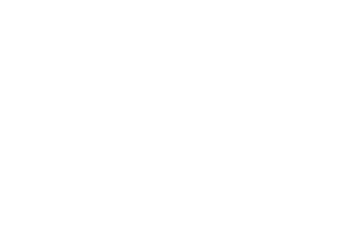

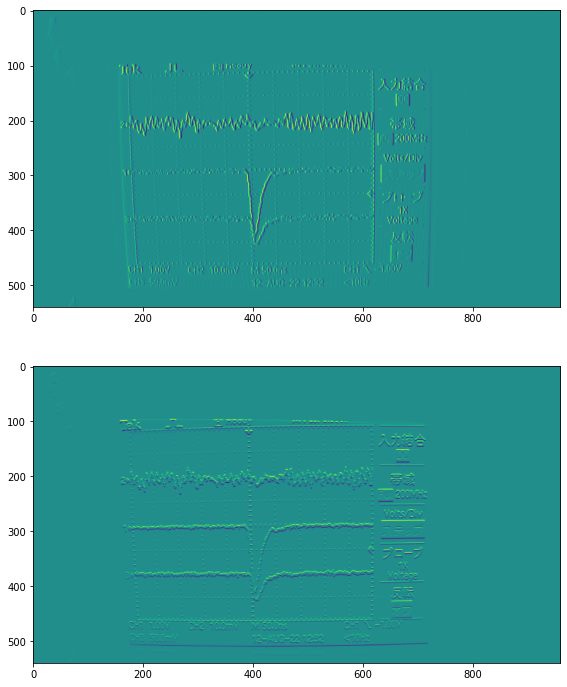

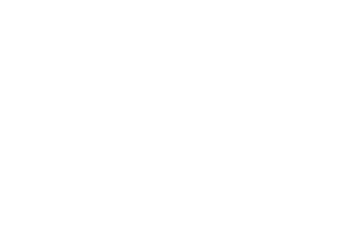

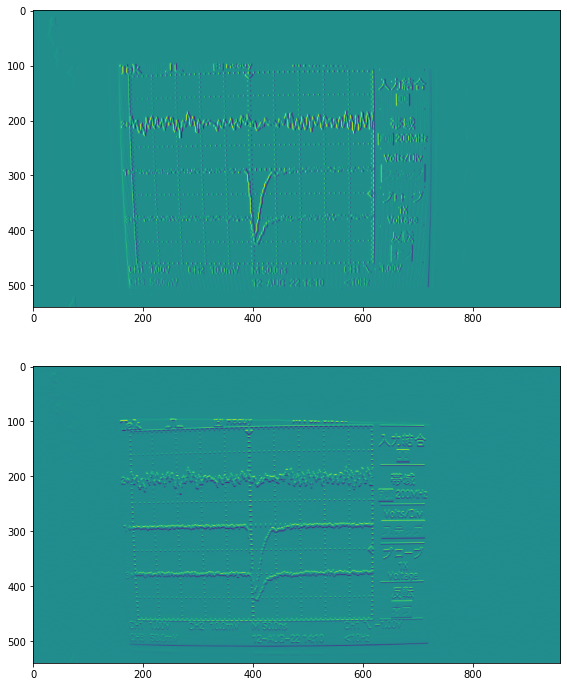

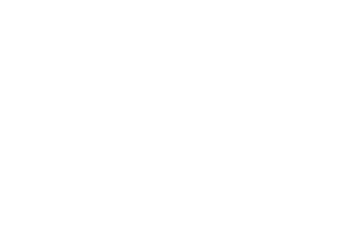

...

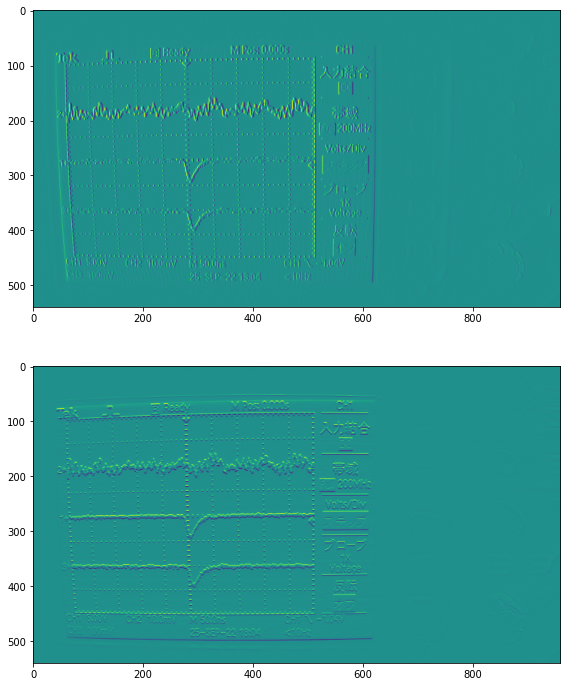

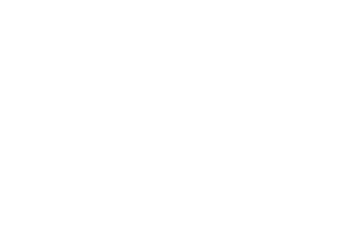

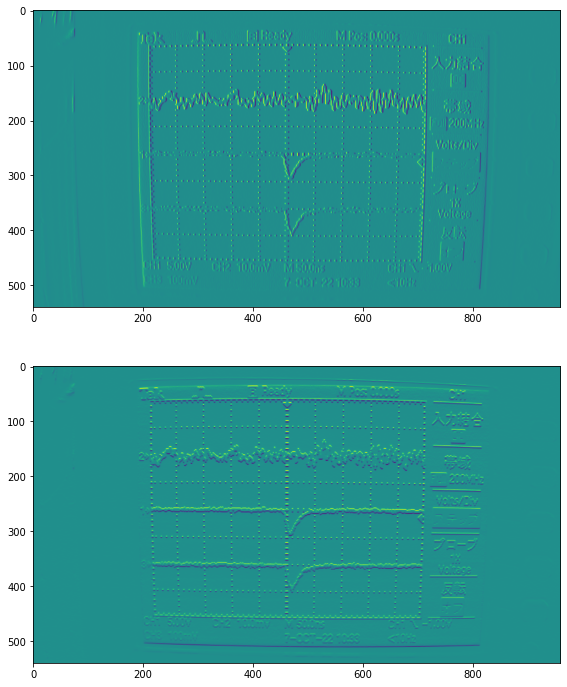

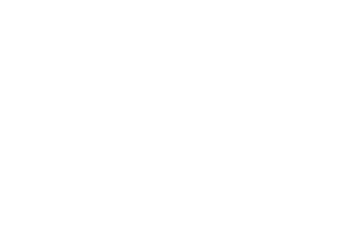

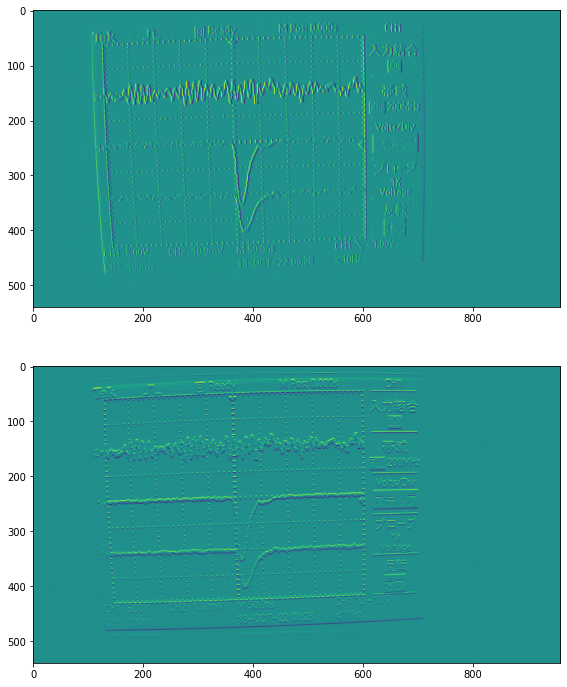

In [65]:
for i in range( 0 , ImageNamesLen , 1 ):
  for j in range( 0 , len(ImageNames[i]) , 1 ):
    # 使う画像
    img = cv2.imread( ImageNames[i][j] )

    # 一回微分をする
    img_out_x = GetImage_Filter_Sobel_X( img )
    img_out_y = GetImage_Filter_Sobel_Y( img )

    # 表示
    # 座標軸の削除処理
    fig,ax = plt.subplots()
    ax.tick_params(labelbottom="off",bottom="off")
    ax.tick_params(labelleft="off",left="off")
    ax.set_xticklabels([]) 
    ax.axis('off')
    # 表示
    plt.figure(figsize=(15,12))
    plt.subplot( 2 , 1 , 1 )
    plt.imshow( img_out_x )
    plt.subplot( 2 , 1 , 2 )
    plt.imshow( img_out_y )

    # 画像として出力
#    cv2.imwrite( 'im_sobel_x' + str(i) + '_' + str(j) + '_' + str(j+1) + '.png' , im_diff_abs )
#    cv2.imwrite( 'im_sobel_y' + str(i) + '_' + str(j) + '_' + str(j+1) + '.png' , im_diff_abs )

#**Laplacianフィルタを適用した画像**

<ipython-input-69-be427b1ff9d6>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()
<ipython-input-69-be427b1ff9d6>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,12))


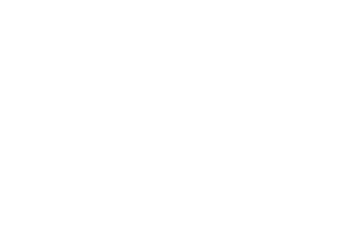

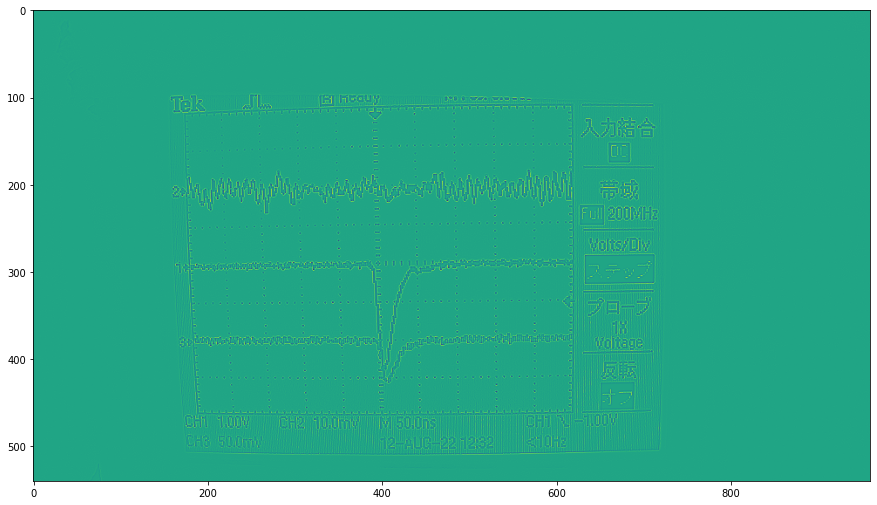

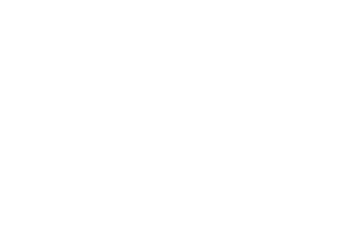

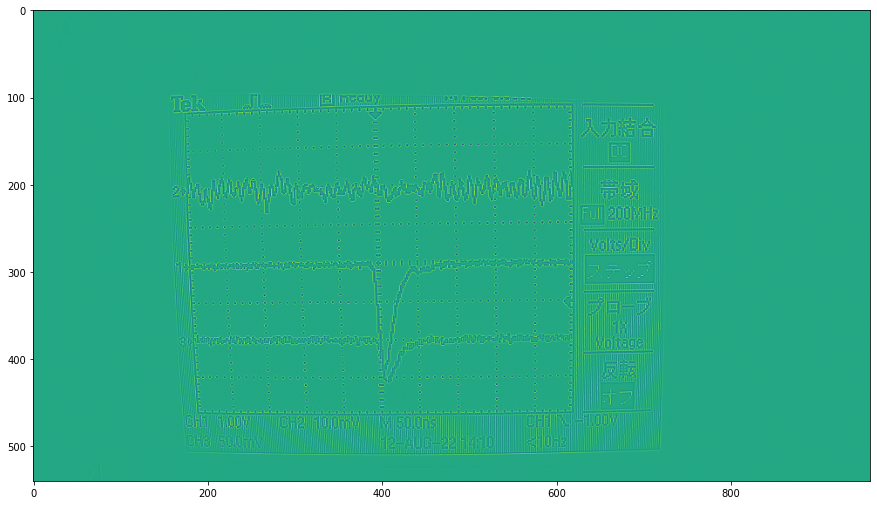

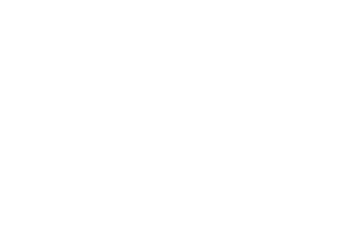

...

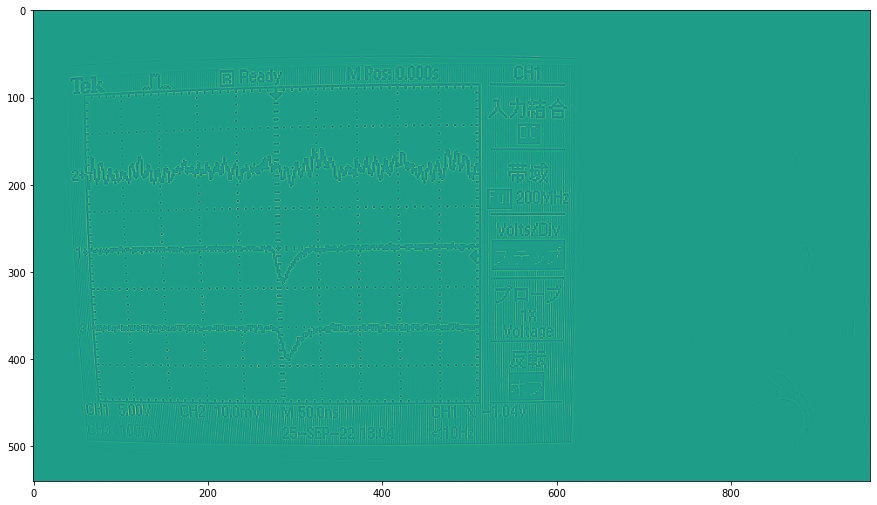

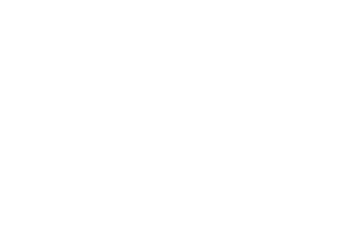

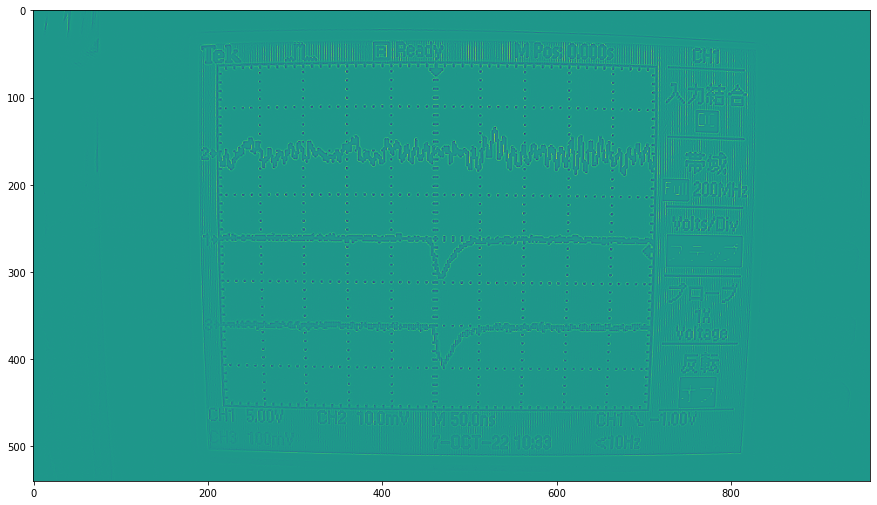

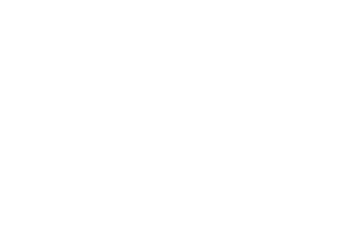

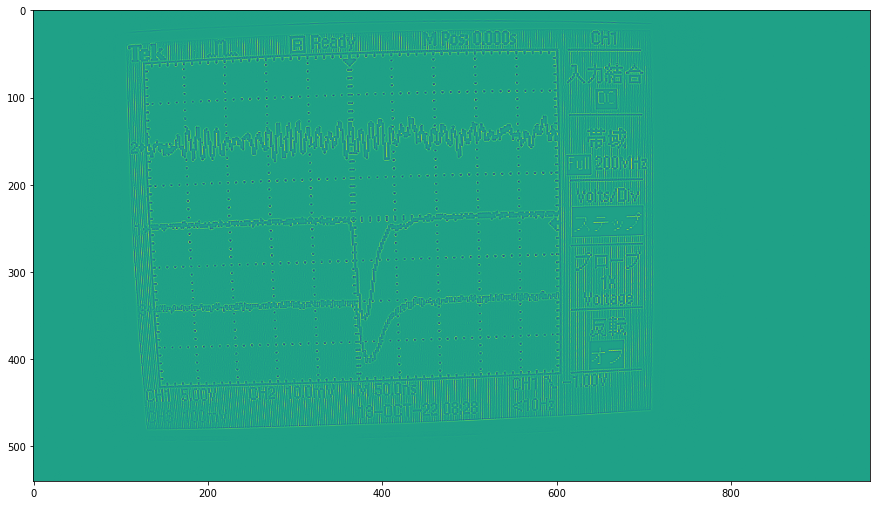

In [69]:
for i in range( 0 , ImageNamesLen , 1 ):
  for j in range( 0 , len(ImageNames[i]) , 1 ):
    # 使う画像
    img = cv2.imread( ImageNames[i][j] )

    # Laplacianフィルタを適用する
    img_out = GetImage_Filter_Laplacian( img )

    # 表示
    # 座標軸の削除処理
    fig,ax = plt.subplots()
    ax.tick_params(labelbottom="off",bottom="off")
    ax.tick_params(labelleft="off",left="off")
    ax.set_xticklabels([]) 
    ax.axis('off')
    # 表示
    plt.figure(figsize=(15,12))
    plt.imshow( img_out )

    # 画像として出力
#    cv2.imwrite( 'im_laplacian' + str(i) + '_' + str(j) + '_' + str(j+1) + '.png' , im_diff_abs )

#**キャニー法によるエッジ抽出画像**

<ipython-input-93-07993f80b3cc>:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()
<ipython-input-93-07993f80b3cc>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(15,12))


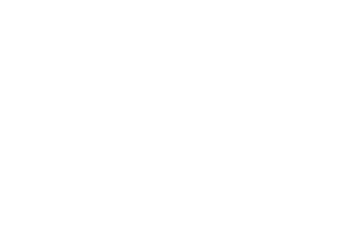

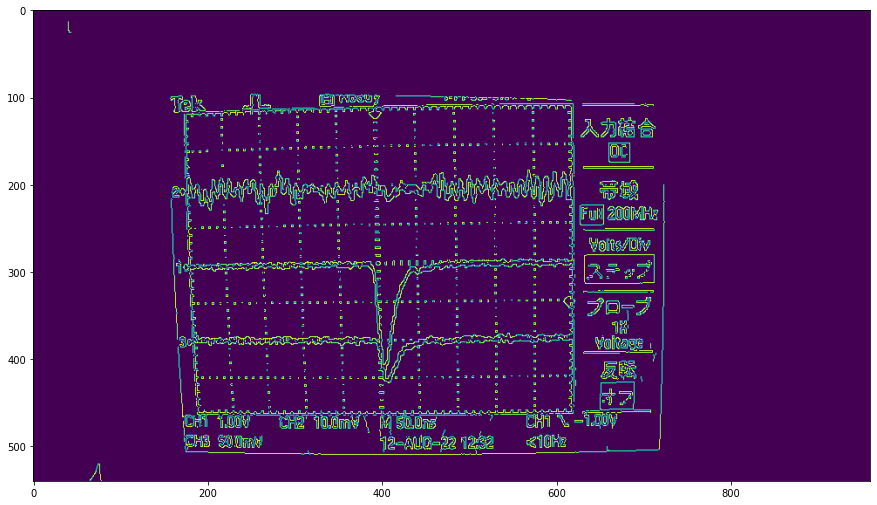

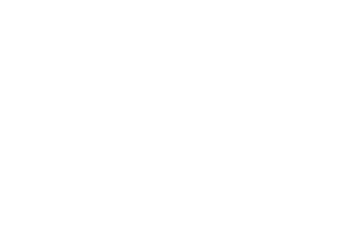

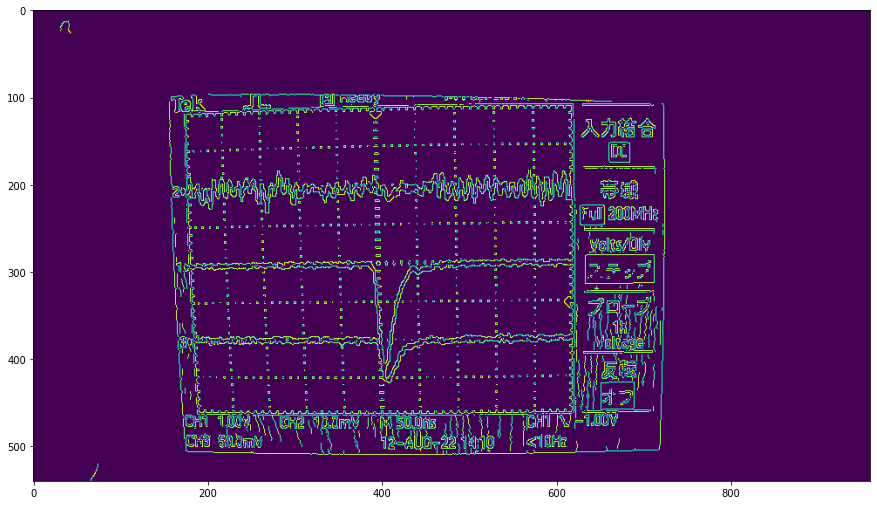

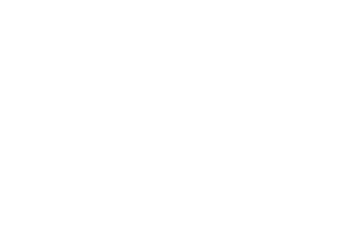

...

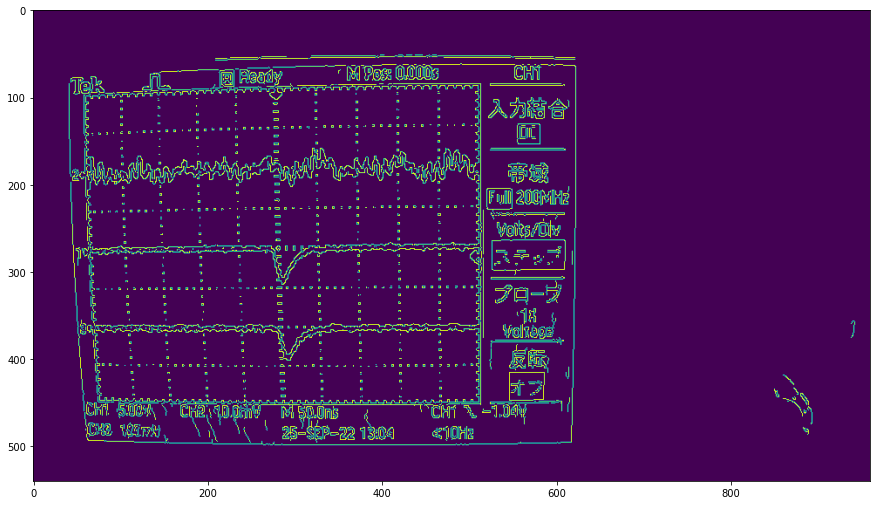

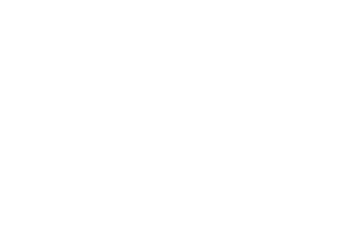

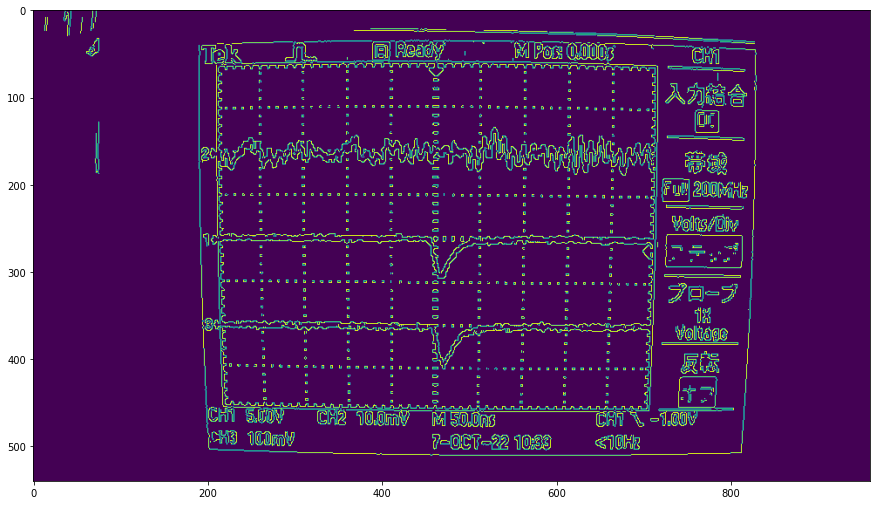

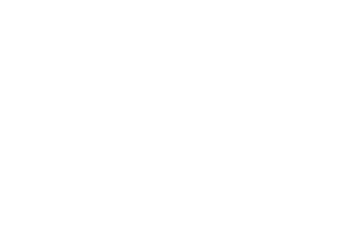

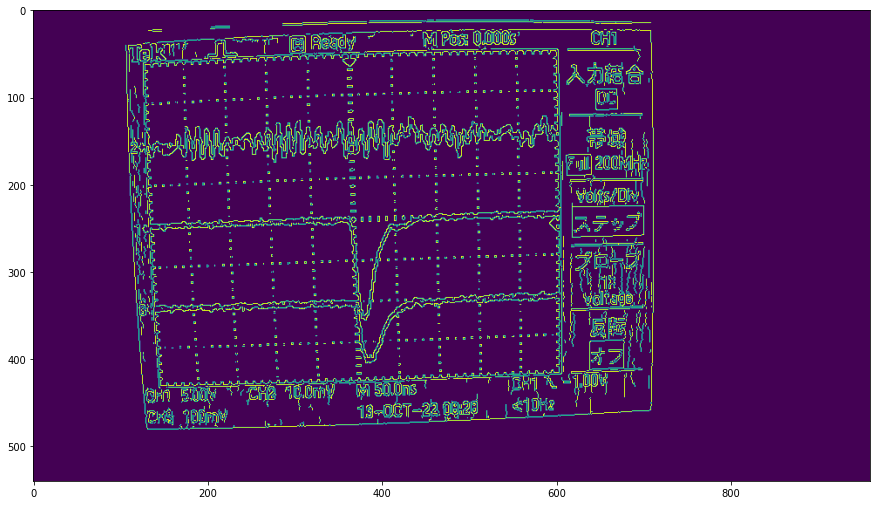

In [93]:
for i in range( 0 , ImageNamesLen , 1 ):
  for j in range( 0 , len(ImageNames[i]) , 1 ):
    # 使う画像
    img = cv2.imread( ImageNames[i][j] )

    # キャニー法を適用する
    img_out = GetImage_Filter_Canny( img )

    # 表示
    # 座標軸の削除処理
    fig,ax = plt.subplots()
    ax.tick_params(labelbottom="off",bottom="off")
    ax.tick_params(labelleft="off",left="off")
    ax.set_xticklabels([]) 
    ax.axis('off')
    # 表示
    plt.figure(figsize=(15,12))
    plt.imshow( img_out )

    # 画像として出力
#    cv2.imwrite( 'im_canny' + str(i) + '_' + str(j) + '_' + str(j+1) + '.png' , im_diff_abs )